# ICESat-2 Bathymetry Manual Classification

__NOT FOR DISTRIBUTION__

## Introduction
This notebook provides the basic functionality for manually classifying bathymetric returns in ICESat-2 photon data.

First, we will demonstrate manual classification of bathymetry in local ATL03 H5 files of release 005 or higher. ICESat-2 ATL03 files can be downloaded using [NSIDC](https://nsidc.org/data/atl03). 

Next we will approximately model the water surface and employ a refraction correction as outlined in [Parrish et al. 2019](https://doi.org/10.3390/rs11141634). Finally, we will output the refracted depth data in a CSV file (LAS output under construction).

Note: It is highly recommended that users employ spatial subsetting through Other Access Options > EarthData Search when downloading NSIDC data, as raw ATL03 files can be quite large (2GB+) and extend beyond far the range of the typical bathymetry area of interest. 

__Jonathan Markel__<br />
Graduate Research Assistant <br />
[3D Geospatial Laboratory](https://magruder3dgl.com/icesat-2)<br />
The University of Texas at Austin <br />
jonathanmarkel@gmail.com

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import h5py
import os
import re
import matplotlib.pyplot as plt
import pyproj
from datetime import datetime

from scipy.stats import norm
from scipy.signal import peak_widths, find_peaks
from astropy.time import Time, TimeDatetime
import laspy

import ipywidgets as widgets
import warnings
from tqdm import tqdm 
from ipyfilechooser import FileChooser

In [2]:
surface_class = 41
no_bottom_class = 45
bathy_class = 40

## Read Local H5 Files
The following code is pulled directly from Demo_Read_ATL03_for_Bathymetry.ipynb.

In [3]:
def convert_seg_to_ph_res(segment_res_data,
                          ph_index_beg,
                          segment_ph_cnt,
                          total_ph_cnt):

    '''Upsamples segment-rate data to the photon-rate.'''

    # initialize photon resolution array
    ph_res_data = pd.Series(np.nan, index=list(range(total_ph_cnt)))

    # trim away segments without photon data
    segs_with_data = segment_ph_cnt != 0

    segment_ph_cnt = segment_ph_cnt[segs_with_data]
    ph_index_beg = ph_index_beg[segs_with_data]
    segment_res_data = segment_res_data[segs_with_data]

    # set value for first photon in segment
    ph_res_data.iloc[ph_index_beg - 1] = segment_res_data
    ph_res_data.fillna(method='ffill', inplace=True)

    return ph_res_data.values

def read_h5_as_df(h5_file_path, gtxx, conf_type=1, verbose=False):
    
    if ((conf_type <= 0) or (conf_type >= 4)):
        raise Exception('''Requested confidence type must be between 
            0 and 4 (land, ocean, sea ice, land ice and inland water).''')
    
    # checks on beam input
    
    if isinstance(gtxx, str):
        # user input a single string like 'gt1r'
        
        # check its the right format
        gtxx = gtxx.lower()
        
        if re.search('gt[1-3][lr]', gtxx) is None:
            raise Exception('Unrecognized beam format. Use GT#(L/R) - for example, \'GT1R\'.')
        
        # set up in iterable
        gtxx = [gtxx]
        
        
    elif isinstance(gtxx, list):
        # user input a list of strings
        
        # make all inputs lowercase and remove duplicates
        
        gtxx = [g.lower() for g in gtxx]
        
        gtxx = list(np.unique(gtxx))
        
        # check all elements are the right format
        if any(re.search('gt[1-3][lr]', g) is None for g in gtxx):
            
            raise Exception('Unrecognized beam format. Use GT#(L/R) - for example, \'GT1R\'.')
        
        pass
    
    else:
        raise Exception('''Requested beams must be either a string (e.g.\'gt1r\')
                        or list (e.g. [\'gt1r\', \'gt2l\']).''')
        
    df_all = []
    if verbose:
        print(h5_file_path)
        print('File size: {:.2f} GB'.format(os.path.getsize(h5_file_path) / 1e9))
    
    with h5py.File(h5_file_path, 'r') as f:
        for beam in tqdm(gtxx):
            pho = dict()
            seg = dict()
            anc= {}
            
            if verbose: print(beam.upper())
            
            if verbose: print('Reading photon-resolution data...')
            ##### PHOTON RESOLUTION DATA #####

            lat_ph = np.array(f[beam + '/heights/lat_ph'])

            lon_ph = np.array(f[beam + '/heights/lon_ph'])

            pho['geometry'] = gpd.points_from_xy(lon_ph, lat_ph)

            pho['delta_time'] = np.array(f[beam + '/heights/delta_time'])

            pho['height'] = np.array(f[beam + '/heights/h_ph'])

            # sliderule documentation not clear on this - skipping
            #df['distance'] = np.array(f[gtxx + '/heights/dist_ph_along'])

            pho['quality_ph'] = np.array(f[beam + '/heights/quality_ph'])

            signal_conf = np.array(f[beam + '/heights/signal_conf_ph'])

            pho['atl03_cnf'] = signal_conf[:, conf_type] # user input signal type

            if verbose: print('Reading ancillary data...')
            ##### ANCILLARY / ORBIT DATA #####

            # variable resolution 

            anc['atlas_sdp_gps_epoch'] = np.array(
                f['/ancillary_data/atlas_sdp_gps_epoch'])

            anc['sc_orient'] = np.array(
                f['/orbit_info/sc_orient'])

            anc['sc_orient_time'] = np.array(
                f['/orbit_info/sc_orient'])

            anc['rgt'] = np.array(
                f['/orbit_info/rgt'])

            pho['rgt'] = np.int64(anc['rgt'][0] * np.ones(len(lat_ph)))

            anc['orbit_number'] = np.array(
                f['/orbit_info/orbit_number'])

            anc['cycle_number'] = np.array(
                f['/orbit_info/cycle_number'])

            pho['cycle'] = np.int64(anc['cycle_number'][0] * np.ones(len(lat_ph)))
            
            if len(anc['sc_orient']) == 1:
                # no spacecraft transitions during this granule
                pho['sc_orient'] = np.int64(anc['sc_orient'][0] * np.ones(len(lat_ph)))
            else:
                warnings.warn('Spacecraft in transition detected! sc_orient parameter set to -1.')
                pho['sc_orient'] = np.int64(-1 * np.ones(len(lat_ph)))

            # track / pair data from user input

            pho['track'] = np.int64(beam[2]) * np.ones(len(lat_ph), dtype=np.int64)

            if beam[3].lower() == 'r':
                pair_val = 1
                
            elif beam[3].lower() == 'l':
                pair_val = 0

            pho['pair'] = pair_val * np.ones(len(lat_ph), dtype=np.int64)

            if verbose: print('Reading segment resolution data and upsampling...')
            ##### SEGMENT RESOLUTION DATA #####
            seg['ref_azimuth'] = np.array(
                f[beam + '/geolocation/ref_azimuth'])

            seg['ref_elev'] = np.array(
                f[beam + '/geolocation/ref_elev'])

            seg['segment_id'] = np.array(
                f[beam + '/geolocation/segment_id'])

            seg['segment_dist_x'] = np.array(
                f[beam + '/geolocation/segment_dist_x'])

            seg['solar_azimuth'] = np.array(
                f[beam + '/geolocation/solar_azimuth'])

            seg['solar_elev'] = np.array(
                f[beam + '/geolocation/solar_elevation'])

            seg['ph_index_beg'] = np.array(
                f[beam + '/geolocation/ph_index_beg'])

            seg['segment_ph_cnt'] = np.array(
                f[beam + '/geolocation/segment_ph_cnt'])

            seg['geoid'] = np.array(
                f[beam + '/geophys_corr/geoid'])
            
            ##### UPSAMPLE SEGMENT RATE DATA #####
            pho['segment_id']    = np.int64(convert_seg_to_ph_res(segment_res_data=seg['segment_id'],
                                       ph_index_beg=seg['ph_index_beg'],
                                       segment_ph_cnt=seg['segment_ph_cnt'],
                                       total_ph_cnt=len(lat_ph)))

            pho['segment_dist']    = convert_seg_to_ph_res(segment_res_data=seg['segment_dist_x'],
                                       ph_index_beg=seg['ph_index_beg'],
                                       segment_ph_cnt=seg['segment_ph_cnt'],
                                       total_ph_cnt=len(lat_ph))

            pho['ref_azimuth']    = convert_seg_to_ph_res(segment_res_data=seg['ref_azimuth'],
                                       ph_index_beg=seg['ph_index_beg'],
                                       segment_ph_cnt=seg['segment_ph_cnt'],
                                       total_ph_cnt=len(lat_ph))
            pho['ref_elev']       = convert_seg_to_ph_res(segment_res_data=seg['ref_elev'],
                                       ph_index_beg=seg['ph_index_beg'],
                                       segment_ph_cnt=seg['segment_ph_cnt'],
                                       total_ph_cnt=len(lat_ph))
            
            pho['geoid_z']       = convert_seg_to_ph_res(segment_res_data=seg['geoid'],
                                       ph_index_beg=seg['ph_index_beg'],
                                       segment_ph_cnt=seg['segment_ph_cnt'],
                                       total_ph_cnt=len(lat_ph))

            if verbose: print('Converting times...')
            ##### TIME CONVERSION / INDEXING #####
            
            t_gps = Time(anc['atlas_sdp_gps_epoch'] + pho['delta_time'], format='gps')
            t_utc = Time(t_gps, format='iso', scale='utc')
            pho['time'] = t_utc.datetime

            # sorting into the same order as sliderule df's purely for asthetics
            if verbose: print('Concatenating data...')
            df = gpd.GeoDataFrame(pho)
            
            df.set_index('time', inplace=True)
            
            df = df.loc[:, ['rgt', 'cycle', 'track', 'segment_id', 'segment_dist',
                            'sc_orient', 'atl03_cnf', 'height', 'quality_ph', 'delta_time', 'pair', 'geometry',
                           'ref_azimuth', 'ref_elev', 'geoid_z'] ]
        
            df_all.append(df)
        
    return pd.concat(df_all)

def reduce_gdf(gdf, RGT=None, track=None, pair=None, cycle=None):
    ''''''
    D = gdf.copy()
    
    if RGT is not None:
        D = D[D["rgt"] == RGT]
    if track is not None:
        D = D[D["track"] == track]
    if pair is not None:
        D = D[D["pair"] == pair]
    if cycle is not None:
        D = D[D["cycle"] == cycle] 
        
    return D

In [4]:
base_directory = '' # use starting directory of this script
fc = FileChooser(base_directory) # change me!
fc.filter_pattern = '*.h5'
display(fc)

FileChooser(path='/Users/jonathan/Documents/Research/OpenOceans_Public/demos', filename='', title='', show_hid…

In [5]:
# use file path from file chooser widget
h5_file_path = fc.selected

# example: use both strong and weak of beam 1
gtxx = ['gt1r', 'gt1l', 'gt2r', 'gt2l', 'gt3r', 'gt3l'] 

# example: can also input a single string
# gtxx = 'gt3r'

# will also return the atl03 signal confidence for a specified surface type
# 0-4 (land, ocean, sea ice, land ice and inland water)
srt = 1 

gdf = read_h5_as_df(h5_file_path, gtxx, srt, verbose=False)

gdf.head()

100%|██████████████████████████████████████████| 6/6 [00:02<00:00,  2.51it/s]


,rgt,cycle,track,segment_id,segment_dist,sc_orient,atl03_cnf,height,quality_ph,delta_time,pair,geometry,ref_azimuth,ref_elev,geoid_z
time,,,,,,,,,,,,,,,
2021-08-17 15:59:12.366558,840,12,1,1109512,2.222995e+07,1,4,58.792816,0,1.144512e+08,0,POINT (149.53213 -19.42119),-1.221945,1.561858,58.056339
2021-08-17 15:59:12.366758,840,12,1,1109512,2.222995e+07,1,4,58.619476,0,1.144512e+08,0,POINT (149.53213 -19.42120),-1.221945,1.561858,58.056339
2021-08-17 15:59:12.370558,840,12,1,1109514,2.222999e+07,1,4,58.044888,0,1.144512e+08,0,POINT (149.53210 -19.42145),-1.221926,1.561858,58.056358
2021-08-17 15:59:12.370758,840,12,1,1109514,2.222999e+07,1,4,57.736149,0,1.144512e+08,0,POINT (149.53210 -19.42146),-1.221926,1.561858,58.056358
2021-08-17 15:59:12.371058,840,12,1,1109514,2.222999e+07,1,4,58.613258,0,1.144512e+08,0,POINT (149.53210 -19.42148),-1.221926,1.561858,58.056358


## Sort and Select Profile(s) to Classify

Use interactive plots to visualize the H5 data in our DataFrame. The use the dropdown menu to select the profile you want to manually classify.

In [6]:
# must be called after sliderule query completed
import seaborn as sns
import bokeh
from bokeh.tile_providers import get_provider
tile_provider = get_provider('ESRI_IMAGERY')
from bokeh.models import ColumnDataSource, CustomJS, Button, Circle
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.layouts import gridplot, row
output_notebook()

Loading BokehJS ...

In [25]:
# only built for one h5 file right now

plot_limit = 10 # max figures to plot before stopping
subsample_count = 1e5 #reduce load by only plotting this many photons

# go through each granule and visualize any available beams
is2_profiles = []

plot_count = 0

rgt_ = gdf.rgt.unique()[0]
cycle_ = gdf.cycle.unique()[0]
for track_ in [1, 2, 3]:
    for pair_ in [0, 1]:
        try:
            gdf_ = reduce_gdf(gdf, RGT=int(rgt_), cycle=int(cycle_), track=track_, pair=pair_)

        except:
            continue

        if gdf_.shape[0] > 0:
            profile_id_str = '{} {} {} {}'.format(rgt_, cycle_, track_, pair_)
            is2_profiles.append(profile_id_str)
            if plot_count < plot_limit:
                plot_count += 1
                gran_plotted = True

                # subsample photon data for quicker plotting
                gdf__=gdf_.sample(min(int(subsample_count), gdf_.shape[0]))

                # convert sampled gdf lat lon to web mercator for plotting
                wgs84 = pyproj.crs.CRS.from_epsg(4979)
                web_merc = pyproj.crs.CRS.from_epsg(3857)
                tform = pyproj.transformer.Transformer.from_crs(crs_from=wgs84, crs_to=web_merc)
                y_wm, x_wm = tform.transform(gdf__.geometry.y, gdf__.geometry.x)

                fig_map = figure(x_range=(min(y_wm), max(y_wm)), 
                                                y_range=(min(x_wm)-(max(y_wm)-min(y_wm)) * 0.2, 
                                                         max(x_wm)+(max(y_wm)-min(y_wm)) * 0.2), # zooms out proportionally
                                                width=420, height=420,
                                                x_axis_type="mercator", y_axis_type="mercator", 
                                 tools='zoom_in,zoom_out,pan,box_zoom,wheel_zoom,undo,redo,reset')
                fig_map.add_tile(tile_provider)
                fig_map.line(y_wm, x_wm, color='red', line_width=1)                

                fig = figure(title=profile_id_str + ' (SAMPLE)',
                                            width=420, height=420, x_axis_type="mercator", 
                                            x_range=fig_map.y_range, tools='zoom_in,zoom_out,pan,box_zoom,wheel_zoom')

                fig.circle(x_wm, gdf__.height, size=1)

                fig_grid = row([fig, fig_map])
                show(fig_grid)


            else:
                print('Reached maximum number of quick view plots set by user. ({})'.format(plot_limit))  
                break

# select the desired track from the drop down
# use widgets.SelectMultiple later
# make this better...
profiles_to_classify = widgets.Dropdown(
    options=is2_profiles,
    value=is2_profiles[0],
    description='Select:',
    disabled=False, layout={'width': 'max-content'}
)
display(profiles_to_classify)

Dropdown(description='Select:', layout=Layout(width='max-content'), options=('840 12 1 0', '840 12 1 1', '840 …

,lon,lat,height_ortho,rgt,cycle,track,segment_id,segment_dist,sc_orient,atl03_cnf,height,quality_ph,delta_time,pair,geometry,ref_azimuth,ref_elev,geoid_z
time,,,,,,,,,,,,,,,,,,
2021-08-17 15:59:12.366558,149.532129,-19.421189,0.736751,840,12,1,1109512,2.222995e+07,1,4,58.792816,0,1.144512e+08,0,POINT (149.53213 -19.42119),-1.221945,1.561858,58.056339
2021-08-17 15:59:12.366758,149.532128,-19.421202,0.563411,840,12,1,1109512,2.222995e+07,1,4,58.619476,0,1.144512e+08,0,POINT (149.53213 -19.42120),-1.221945,1.561858,58.056339
2021-08-17 15:59:12.370558,149.532103,-19.421445,-0.011170,840,12,1,1109514,2.222999e+07,1,4,58.044888,0,1.144512e+08,0,POINT (149.53210 -19.42145),-1.221926,1.561858,58.056358
2021-08-17 15:59:12.370758,149.532102,-19.421458,-0.319908,840,12,1,1109514,2.222999e+07,1,4,57.736149,0,1.144512e+08,0,POINT (149.53210 -19.42146),-1.221926,1.561858,58.056358
2021-08-17 15:59:12.371058,149.532100,-19.421477,0.557202,840,12,1,1109514,2.222999e+07,1,4,58.613258,0,1.144512e+08,0,POINT (149.53210 -19.42148),-1.221926,1.561858,58.056358


Text(0.5, 1.0, 'All photon data for the selected track')

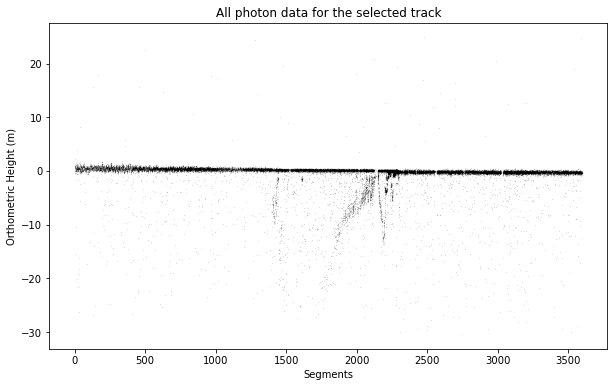

In [8]:
# proceding with the track just selected
pc_name = profiles_to_classify.value.split(' ')

gdf1 = reduce_gdf(gdf, 
                  RGT=int(pc_name[0]), 
                  cycle=int(pc_name[1]), 
                  track=int(pc_name[2]), 
                  pair=int(pc_name[3]))

# convert to orthometric heights
if 'height_ortho' not in gdf1.columns:
    wgs84 = pyproj.crs.CRS.from_epsg(4979)
    wgs84_egm08 = pyproj.crs.CRS.from_epsg(3855)
    tform = pyproj.transformer.Transformer.from_crs(crs_from=wgs84, crs_to=wgs84_egm08)
    _, _, z_g = tform.transform(gdf1.geometry.y, gdf1.geometry.x, gdf1.height)

    gdf1.insert(0, 'height_ortho', z_g, False) 
else:
    raise Exception('Orthometric heights already in reduced dataframe')
    
# reorganizing lat/lon
if 'lat' not in gdf1.columns: 
    gdf1.insert(0, 'lat', gdf1.geometry.y, False) 
if 'lon' not in gdf1.columns: 
    gdf1.insert(0, 'lon', gdf1.geometry.x, False)
    
if 'distance' in gdf1.columns:
    # currently not being passed with the local h5 files
    if 'along_track' not in gdf1.columns:
        at_ = gdf1.segment_dist + gdf1.loc[:, 'distance']
        gdf1.insert(0, 'along_track', at_ - min(at_), False)

display(gdf1.head())

plt.figure(figsize=(10,6))
plt.plot(gdf1.segment_id - gdf1.segment_id.min(), gdf1.height_ortho, 'k.', alpha=0.5, markersize=0.2)
plt.xlabel('Segments')
plt.ylabel('Orthometric Height (m)')
plt.title('All photon data for the selected track')
#plt.ylim((-25, 25))

## Surface Modeling
We need a method of measuring the surface height for use in calculating refracted depths. Additionally, being able to exclude the photon-dense surface from the interactive plots later helps with computational speed. For simplicity we will histogram the photons in each segment and fit a gaussian to the primary return, and assume that's the surface return. However, there are *many ways* to determine the surface model with a higher accuracy if one so chooses.

In [11]:
def surface_gauss(counts, surf_mag, surf_loc, surf_std):

    y_out = (surf_mag * (np.sqrt(2 * np.pi) * surf_std)) * \
            norm.pdf(counts, surf_loc, surf_std)
    
    return y_out

# tweakable parameters
z_bin_size = 0.1

# vertical bins from 100m depth to 50m above 0 datum
z_bin_edges = np.arange(-25, 75 + z_bin_size, z_bin_size)
z_centered_bins = z_bin_edges[:-1] + z_bin_size

# at each 20m segment evaluate the 100m on either side
process_chunk_half_width = 5

# initialize photon resolution surface model
gdf1['height_surface'] = np.nan * np.zeros(gdf1.shape[0])
gdf1['surface_bottom'] = np.nan * np.zeros(gdf1.shape[0])
gdf1['surface_top'] = np.nan * np.zeros(gdf1.shape[0])

# initialize classification array
gdf1['classification'] = np.int64(np.zeros(gdf1.shape[0]))

# initialize refraction dZ array
gdf1['dZ'] = np.zeros(gdf1.shape[0])

display(gdf1.head())

,lon,lat,height_ortho,rgt,cycle,track,segment_id,segment_dist,sc_orient,atl03_cnf,...,pair,geometry,ref_azimuth,ref_elev,geoid_z,height_surface,surface_bottom,surface_top,classification,dZ
time,,,,,,,,,,,,,,,,,,,,,
2021-08-17 15:59:12.366558,149.532129,-19.421189,0.736751,840,12,1,1109512,2.222995e+07,1,4,...,0,POINT (149.53213 -19.42119),-1.221945,1.561858,58.056339,NaN,NaN,NaN,0,0.0
2021-08-17 15:59:12.366758,149.532128,-19.421202,0.563411,840,12,1,1109512,2.222995e+07,1,4,...,0,POINT (149.53213 -19.42120),-1.221945,1.561858,58.056339,NaN,NaN,NaN,0,0.0
2021-08-17 15:59:12.370558,149.532103,-19.421445,-0.011170,840,12,1,1109514,2.222999e+07,1,4,...,0,POINT (149.53210 -19.42145),-1.221926,1.561858,58.056358,NaN,NaN,NaN,0,0.0
2021-08-17 15:59:12.370758,149.532102,-19.421458,-0.319908,840,12,1,1109514,2.222999e+07,1,4,...,0,POINT (149.53210 -19.42146),-1.221926,1.561858,58.056358,NaN,NaN,NaN,0,0.0
2021-08-17 15:59:12.371058,149.532100,-19.421477,0.557202,840,12,1,1109514,2.222999e+07,1,4,...,0,POINT (149.53210 -19.42148),-1.221926,1.561858,58.056358,NaN,NaN,NaN,0,0.0


In [ ]:
print('Constructing surface model...')

for seg_i in tqdm( np.arange(gdf1.segment_id.min(), gdf1.segment_id.max(), 1) ):
    
    # index for segment processing window
    chunk_i = (gdf1.segment_id >= (seg_i-process_chunk_half_width)) \
        & (gdf1.segment_id <= (seg_i+process_chunk_half_width))
    
    gdf_seg = gdf1.loc[ chunk_i , : ]
    
    depth = -gdf_seg.height_ortho
    
    hist, _ = np.histogram(depth, bins=z_bin_edges)
    
    # find peaks
    pk_i, pk_dict = find_peaks(hist)

    pk_dict['fwhm'], pk_dict['width_heights_hm'], pk_dict['left_ips_hm'] ,pk_dict['right_ips_hm'] \
        = peak_widths(hist , pk_i , rel_height=0.4)
    
    pk_dict['i'] = pk_i
    
    pk_dict['heights'] = hist[pk_dict['i']]

    # estimate standard deviation
    pk_dict['sigma_est'] = z_bin_size * (pk_dict['fwhm'] / 2.35) # std. dev. est.
    
    # get z value of peak
    pk_dict['z'] = z_centered_bins[pk_dict['i']]

    pk_df = pd.DataFrame.from_dict(pk_dict, orient='columns')
    
    pk_df.sort_values(by='heights', inplace=True, ascending=False)
    
    if pk_df.shape[0] == 0:
        # no peaks in segment
        continue
        
    else:
        surf_pk = pk_df.iloc[0]

        gdf1.loc[ gdf1.segment_id == seg_i, 'height_surface' ] = -surf_pk.z

        gdf1.loc[ gdf1.segment_id == seg_i, 'surface_bottom' ] = -surf_pk.z - 3 * surf_pk.sigma_est
        
        gdf1.loc[ gdf1.segment_id == seg_i, 'surface_top' ] = -surf_pk.z + 3 * surf_pk.sigma_est


Constructing surface model...


100%|███████████████████████████████████| 3597/3597 [00:05<00:00, 634.20it/s]


Visualize the surface model and the deviation-determined bottom bound.

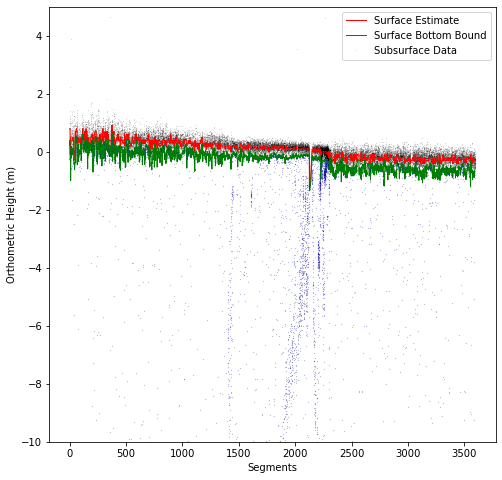

In [10]:
# update classifications for points in the water surface
# using LAS topobathy domain spec class values

surface_idx = (gdf1.height_ortho <= gdf1.surface_top) & (gdf1.height_ortho >= gdf1.surface_bottom)

subsurface_idx = (gdf1.height_ortho < gdf1.surface_bottom)

gdf1.loc[surface_idx, 'classification'] = surface_class
gdf1.loc[subsurface_idx, 'classification'] = no_bottom_class # no bottom found at

plt.figure(figsize=[8, 8])

plt.plot(gdf1.segment_id - gdf1.segment_id.min(), gdf1.height_ortho, 'k.', 
         alpha=0.5, markersize=0.2)

plt.plot(gdf1.segment_id - gdf1.segment_id.min(), gdf1.height_surface, 'r', 
         linewidth=1, label='Surface Estimate')

plt.plot(gdf1.segment_id - gdf1.segment_id.min(), gdf1.surface_bottom, 'g', 
         linewidth=1, label='Surface Bottom Bound')

plt.plot(gdf1.loc[ subsurface_idx , 'segment_id'] - gdf1.segment_id.min(), 
         gdf1.loc[ subsurface_idx , 'height_ortho'], 'b.', 
         alpha=0.5, markersize=0.2, label='Subsurface Data')

plt.legend()
plt.xlabel('Segments')
plt.ylabel('Orthometric Height (m)')
plt.ylim((-10, 5));

# Manual Seabed Extraction


Use the lasso tool in the interactive plot below to select the seabed return. Hold down shift between selections to collect multiple chunks of bathy.

In [16]:
def select_points(doc):
    fig = bokeh.plotting.figure(title='Use selections tools, hold shift for multiple selections...',
                        width=800, height=400, 
                        tools='lasso_select,box_select,pan,box_zoom,undo,redo')
    
    r = fig.scatter('lat', 'height_ortho', source=src, size=1, selection_color='red', legend_label='Data')

    doc.add_root(fig)

# isolate subsurface points
gdf2 = gdf1.loc[gdf1.classification == no_bottom_class, :].reset_index()

# note, geometry doesnt play nicely with Bokeh, removing
src = ColumnDataSource(data=gdf2.drop('geometry', axis=1))# remove geometry field

show(select_points)

# Refraction Correction

Use our water surface model and satellite azimuth/elevation to calculate refraction corrected depths.

In [19]:
def photon_refraction(W, Z, ref_az, ref_el,
                       n1=1.00029, n2=1.34116):
    '''
    ICESat-2 refraction correction implented as outlined in Parrish, et al. 
    2019 for correcting photon depth data.
    
    Highly recommended to reference elevations to geoid datum to remove sea
    surface variations.
    
    https://www.mdpi.com/2072-4292/11/14/1634
    
    Code Author: 
    Jonathan Markel
    Graduate Research Assistant
    3D Geospatial Laboratory
    The University of Texas at Austin
    jonathanmarkel@gmail.com
    
    Parameters
    ----------
    W : float, or nx1 array of float
        Elevation of the water surface.
        
    Z : nx1 array of float
        Elevation of seabed photon data. Highly recommend use of geoid heights.
        
    ref_az : nx1 array of float
        Photon-rate reference photon azimuth data. Should be pulled from ATL03
        data parameter 'ref_azimuth'. Must be same size as seabed Z array.
    
    ref_el : nx1 array of float
        Photon-rate reference photon azimuth data. Should be pulled from ATL03
        data parameter 'ref_elev'. Must be same size as seabed Z array.
    
    n1 : float, optional
        Refractive index of air. The default is 1.00029.
    
    n2 : float, optional
        Refractive index of water. Recommended to use 1.34116 for saltwater 
        and 1.33469 for freshwater. The default is 1.34116.

    Returns
    -------
    dE : nx1 array of float
        Easting offset of seabed photons.
    
    dN : nx1 array of float
        Northing offset of seabed photons.
    
    dZ : nx1 array of float
        Vertical offset of seabed photons.

    '''

    # compute uncorrected depths
    D = W - Z
    H = 496  # mean orbital altitude of IS2, km
    Re = 6371  # mean radius of Earth, km

    # angle of incidence (wout Earth curvature)
    theta_1_ = (np.pi / 2) - ref_el

    # incidence correction for earths curvature
    theta_EC = np.arctan(H * np.tan(theta_1_) / Re)

    # angle of incidence
    theta_1 = theta_1_ + theta_EC

    # angle of refraction
    theta_2 = np.arcsin(n1 * np.sin(theta_1) / n2)  # eq 1

    phi = theta_1 - theta_2

    # uncorrected slant range to the uncorrected seabed photon location
    S = D / np.cos(theta_1)  # eq 3

    # corrected slant range
    R = S * n1 / n2  # eq 2

    P = np.sqrt(R**2 + S**2 - 2*R*S*np.cos(theta_1 - theta_2))  # eq 6

    gamma = (np.pi / 2) - theta_1  # eq 4

    alpha = np.arcsin(R * np.sin(phi) / P)  # eq 5

    beta = gamma - alpha  # eq 7

    # cross-track offset
    dY = P * np.cos(beta)  # eq 8

    # vertical offset
    dZ = P * np.sin(beta)  # eq 9

    kappa = ref_az

    # UTM offsets
    dE = dY * np.sin(kappa)  # eq 10
    dN = dY * np.cos(kappa)  # eq 11

    return dE, dN, dZ

In [20]:
bathy_idx = src.selected.indices

# update classifications on bathy photons
bathy = gdf2.iloc[bathy_idx].copy()

bathy.classification = bathy_class

_, _, dZ = photon_refraction(W=bathy.height_surface, 
                             Z=bathy.height_ortho,  
                             ref_az=bathy.ref_azimuth, 
                             ref_el=bathy.ref_elev,
                             n1=1.00029, n2=1.34116)

bathy.loc[:, 'dZ'] = dZ

# combine surface and bathy classified data
df_out = pd.concat([gdf1.loc[surface_idx].reset_index(), bathy])

#####

p = figure(width=800, height=400)

# add a circle renderer with a size, color, and alpha
p.circle(df_out.lat[df_out.classification == surface_class], 
         df_out.height_ortho[df_out.classification == surface_class], 
         size=1, color="navy", alpha=0.5, 
         legend_label='Surface (Class {:})'.format(surface_class))

p.circle(df_out.lat[df_out.classification == bathy_class], 
         df_out.height_ortho[df_out.classification == bathy_class], 
         size=1, color="red", alpha=0.5, 
         legend_label='Uncorrected Bathymetry (Class {:})'.format(bathy_class))

p.circle(df_out.lat[df_out.classification == bathy_class], 
         df_out.height_ortho[df_out.classification == bathy_class]+df_out.dZ[df_out.classification == bathy_class], 
         size=1, color="GREEN", alpha=0.5, 
         legend_label='CORRECTED Bathymetry (Class {:})'.format(bathy_class))

p.legend.location = "bottom_left"
# show the results
show(p)

## Export Data
Output surface and bathymetry classified photon data to a csv or las file. 

~~LAS file output uses REFRACTION CORRECTED depth in the Z field.~~

LAS functionality here is still in testing and verification towards support of the [topobathy domain profile specification](https://www.asprs.org/wp-content/uploads/2010/12/LAS_Domain_Profile_Description_Topo-Bathy_Lidar.pdf). The output option has been disabled for now.

In [21]:
# choose your own output file name 
# OR
# use ATL03 filename, replacing ATL03_ with BATHY_ and updating file extension to csv/las

h5_name = h5_file_path.split(os.path.sep)[-1]
h5_name_bathy = re.sub('ATL03', 'BATHY', h5_name[:-3])

out_name_widget = widgets.Combobox(
                value=h5_name_bathy,
                #placeholder='Choose Someone',
                description='',
                ensure_option=True,
                style={'description_width': 'initial'},
                disabled=False)

las_widget = widgets.Checkbox(
                value=False,
                description='LAS (disabled)',
                disabled=True,
                indent=False
            )

csv_widget = widgets.Checkbox(
                value=True,
                description='CSV',
                disabled=False,
                indent=False
            )

# output directory file chooser

fc_out = FileChooser('') 

fc_out.show_only_dirs = True

print('Select output directory:')

display(fc_out)

print('Enter output file name base:')

display(out_name_widget)

print('Select output file type(s):')

display(csv_widget)

display(las_widget)

Select output directory:


FileChooser(path='/Users/jonathan/Documents/Research/OpenOceans_Public/demos', filename='', title='', show_hid…

Enter output file name base:


Combobox(value='BATHY_20210817155409_08401208_005_01', ensure_option=True, style=DescriptionStyle(description_…

Select output file type(s):


Checkbox(value=True, description='CSV', indent=False)

Checkbox(value=False, description='LAS (disabled)', disabled=True, indent=False)

In [23]:
out_file_base = out_name_widget.value
out_dir = fc_out.selected

if csv_widget.value:
    # user selected csv output option
    csv_out_path = os.path.join(out_dir, out_file_base+'.csv')
    
    # which columns to include in output
    cols_out = ['time', 'lon', 'lat', 'height_ortho', 'classification', 'height_surface', 'dZ']

    df_out.loc[:, cols_out].to_csv(csv_out_path)
    
if las_widget.value:
    las_out_path = os.path.join(out_dir, out_file_base+'.las')

    # Scale/offset data
    # coord = (record * scale) + offset
    # scale lat/lon 4 sig figs 
    # more than that and laspy says it wont fit?
    # also, https://xkcd.com/2170/
    x_offset = df_out.lon.min()
    x_scale = 1e-4
    x_las = (df_out.lon - x_offset) / x_scale

    y_offset = df_out.lat.min()
    y_scale = 1e-4
    y_las = (df_out.lat - y_offset) / y_scale

    z_refract = df_out.height_ortho + df_out.dZ
    z_offset = z_refract.min()
    z_scale = 1
    z_las = (z_refract - z_offset) / z_scale

    # 1. Create a new header
    header = laspy.LasHeader(point_format=1, version="1.4")
    #header.add_extra_dim(laspy.ExtraBytesParams(name="dZ", type=np.float64))
    header.offsets = np.array([x_offset, y_offset, z_offset])
    header.scales = np.array([x_scale, y_scale, z_scale])

    # 2. Create a Las
    las = laspy.LasData(header)

    las.x = x_las
    las.y = y_las
    las.z = z_las
    #las.classification = df_out.classification
    #las.dZ = df_out.dZ

    las.write(las_out_path)

In [40]:
# make dataframe from surface photons, subsurface photons, bathy photons
pd.DataFrame(src.data).loc[:, ['time', 'lon', 'lat', 'height_ortho', 'classification', 'height_surface', 'dZ']]

,index,time,lon,lat,height_ortho,rgt,cycle,track,segment_id,segment_dist,...,delta_time,pair,ref_azimuth,ref_elev,geoid_z,height_surface,surface_bottom,surface_top,classification,dZ
0,0,2021-08-17 15:59:12.370558,149.532103,-19.421445,-0.011170,840,12,1,1109514,2.222999e+07,...,1.144512e+08,0,-1.221926,1.561858,58.056358,0.8,0.391489,1.208511,45,0.0
1,1,2021-08-17 15:59:12.370758,149.532102,-19.421458,-0.319908,840,12,1,1109514,2.222999e+07,...,1.144512e+08,0,-1.221926,1.561858,58.056358,0.8,0.391489,1.208511,45,0.0
2,2,2021-08-17 15:59:12.371358,149.532098,-19.421496,0.028783,840,12,1,1109514,2.222999e+07,...,1.144512e+08,0,-1.221926,1.561858,58.056358,0.8,0.391489,1.208511,45,0.0
3,3,2021-08-17 15:59:12.372058,149.532093,-19.421541,0.084597,840,12,1,1109514,2.222999e+07,...,1.144512e+08,0,-1.221926,1.561858,58.056358,0.8,0.391489,1.208511,45,0.0
4,4,2021-08-17 15:59:12.372358,149.532091,-19.421560,-0.000504,840,12,1,1109514,2.222999e+07,...,1.144512e+08,0,-1.221926,1.561858,58.056358,0.8,0.391489,1.208511,45,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5045,5045,2021-08-17 15:59:22.471558,149.464693,-20.066348,-9.250226,840,12,1,1113097,2.230172e+07,...,1.144512e+08,0,-1.221751,1.561868,57.240807,-0.3,-0.855319,0.255319,45,0.0
5046,5046,2021-08-17 15:59:22.490258,149.464570,-20.067539,-0.661509,840,12,1,1113104,2.230186e+07,...,1.144512e+08,0,-1.221852,1.561868,57.238419,-0.3,-0.626241,0.026241,45,0.0
5047,5047,2021-08-17 15:59:22.492358,149.464555,-20.067672,-0.909988,840,12,1,1113105,2.230188e+07,...,1.144512e+08,0,-1.221853,1.561868,57.238056,-0.3,-0.619149,0.019149,45,0.0
5048,5048,2021-08-17 15:59:22.493958,149.464544,-20.067774,-0.741375,840,12,1,1113105,2.230188e+07,...,1.144512e+08,0,-1.221853,1.561868,57.238056,-0.3,-0.619149,0.019149,45,0.0
